In [85]:
import sys

import os
import matplotlib.pyplot as plt 
import numpy as np
sys.path.append(os.path.abspath('../src'))

In [86]:
from load_utils import load_step_data
from utils import plot_raster_simple
from measures import convert_to_spiketrains

In [120]:
step_data = load_step_data(
    base_dir='../src/save/ER_intermediate_stdp',
    step=0,
    arrays=['base_S_hist','pruned_S_hist_batch', 'removed_ids', 'neuron_type'])


In [121]:
import infomeasure as im
import antropy as ant
import numpy as np
import networkx as nx
from tqdm import tqdm 
im_args = {"approach": "miller_madow", "base": 2}
batch = 0
fraction = 0.33
N = step_data['metadata']['parameters']['N']

S_hist = step_data['arrays']['base_S_hist']
S_hist_R = step_data['arrays']['pruned_S_hist_batch'][batch]

test_fraction = int(len(S_hist) * fraction)

surviving_nodes = keep_indices(step_data['arrays']['removed_ids'][batch], N)
A = S_hist[-test_fraction:, surviving_nodes]
B = S_hist_R[:test_fraction]
C = S_hist_R[-test_fraction:]

# Entropy of network microstates (rows = time, columns = neurons)
h_A = im.entropy(A, **im_args)
h_B = im.entropy(B, **im_args)
h_C = im.entropy(C, **im_args)

In [122]:

post_batch_entropies = []
post_batch_times = []
window_size = test_fraction
step_size = 100

for batch in range(10):
    entropies = []
    times = []

    surviving_nodes = keep_indices(step_data['arrays']['removed_ids'][batch], N)
    A = step_data['arrays']['base_S_hist']
    A = A[:, surviving_nodes]
    im_args = {"approach": "miller_madow", "base": 2}

    B = step_data['arrays']['pruned_S_hist_batch'][batch]
    A = np.concatenate([A,B], axis=0)

        # Time axis for this batch
    T_total = 4000   # or whatever your experiment duration is
    T = A.shape[0]
    dt = T_total / T
    real_time_axis = np.arange(T) * dt

    for start in tqdm(range(0, A.shape[0] - window_size + 1, step_size)):
        window = A[start:start+window_size]
        H = im.entropy(window, **im_args)
        entropies.append(H)
        # Offset post times so they start after pre
        #times.append(times[-1] + (start + window_size//2) if times else (start + window_size//2))
        center_idx = start + window_size // 2

        times.append(real_time_axis[center_idx])

    post_batch_entropies.append(entropies)
    post_batch_times.append(times)



100%|██████████| 134/134 [00:04<00:00, 27.43it/s]


In [125]:

import numpy as np

# Stack all batches to shape (num_batches, num_timepoints)
# First, pad shorter arrays with np.nan so all are the same length
max_len = max(len(x) for x in post_batch_entropies)
entropy_mat = np.full((len(post_batch_entropies), max_len), np.nan)
for i, arr in enumerate(post_batch_entropies):
    entropy_mat[i, :len(arr)] = arr

# Compute mean and 95% bootstrap CIs at each timepoint
n_boot = 1000
means = np.nanmean(entropy_mat, axis=0)
cis_low = []
cis_high = []

rng = np.random.default_rng(seed=42)
for t in range(entropy_mat.shape[1]):
    vals = entropy_mat[:, t]
    vals = vals[~np.isnan(vals)]
    if len(vals) == 0:
        cis_low.append(np.nan)
        cis_high.append(np.nan)
        continue
    boots = rng.choice(vals, size=(n_boot, len(vals)), replace=True)
    boots_mean = np.mean(boots, axis=1)
    cis_low.append(np.percentile(boots_mean, 2.5))
    cis_high.append(np.percentile(boots_mean, 97.5))


# ...existing code...

IndexError: list index out of range

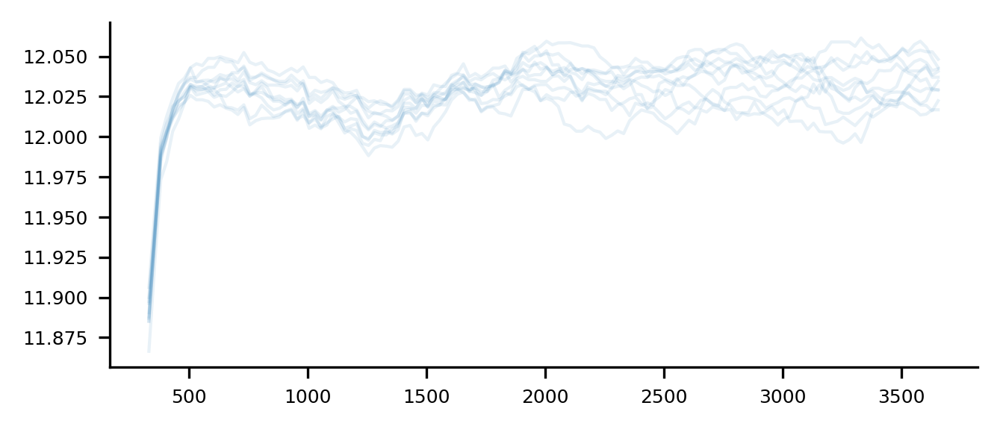

In [126]:
# Use the time axis from the first batch (assumes all aligned)
time_axis = post_batch_times[0][:max_len]
# Build the annotation string
params_text = f"window = {window_size*0.25:.1f} ms\nstep = {step_size*0.25:.1f} ms"

plt.figure(figsize=(5,2))

for batch in range(64):
    plt.plot(post_batch_times[batch], post_batch_entropies[batch], color='C0', alpha=0.1, zorder=0, linewidth=1)

plt.plot(time_axis, means, color='C0', label='Mean', zorder=9)
plt.fill_between(time_axis, cis_low, cis_high, color='C0', alpha=0.3, label='95% CI', zorder=8)

plt.xlabel("Time (center of window)")
plt.ylabel("Entropy (bits)")
plt.axvline(2000, color='red', linestyle='--')

# Put parameters in a text box inside the plot
plt.text(
    0.95, 0.05, params_text,
    transform=plt.gca().transAxes,   # relative to axes (0–1)
    ha='right', va='bottom',
    fontsize=4,
    bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray', boxstyle='round,pad=0.3')
)

plt.title("Running window entropy")
plt.grid(True)
plt.legend()
plt.show()


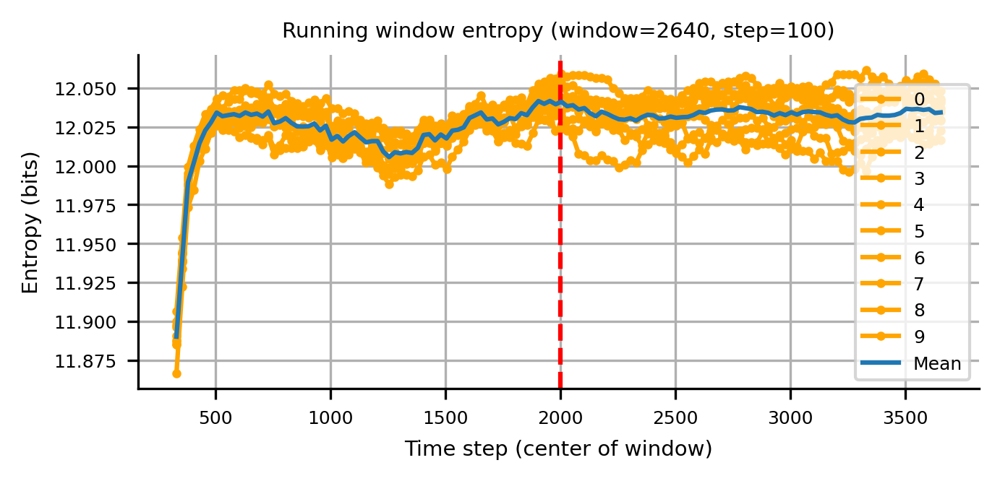

In [147]:
# Plot
plt.figure(figsize=(5,2))
for batch in range(10):
    plt.plot(post_batch_times[batch], post_batch_entropies[batch], marker='o', markersize=2, label=f'{batch}', color='orange')

plt.plot(time_axis, means, color='C0', label='Mean', zorder=9)

   # plt.plot(pre_batch_times[batch], pre_batch_entropies[batch], marker='o', markersize=2)
plt.axvline(2000, color='red', linestyle='--')
plt.xlabel("Time step (center of window)")
plt.ylabel("Entropy (bits)")
plt.title(f"Running window entropy (window={window_size}, step={step_size})")
plt.legend()
plt.grid(True)
plt.show()

(<Figure size 1440x450 with 1 Axes>,
 <Axes: xlabel='Time (ms)', ylabel='Neuron ID'>)

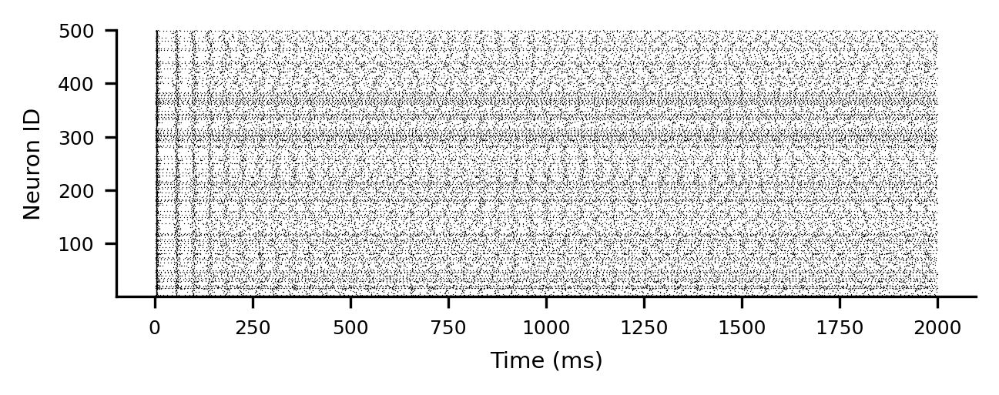

In [128]:
plot_raster_simple(step_data['arrays']['base_S_hist'], 2000, title='', apply_style=True)

In [129]:
import numpy as np

def keep_indices(remove_idx: np.ndarray, N: int) -> np.ndarray:
    """Return fixed-size (N-k,) indices to keep. O(N)."""
    k = remove_idx.shape[0]
    # mask: True for keep, False for remove
    mask = np.ones((N,), dtype=bool)
    mask[remove_idx] = False
    # Grab exactly N-k kept indices, preserving order (left→right).
    keep_idx = np.nonzero(mask)[0]  # (N-k,)
    return keep_idx

def _take_vec(x: np.ndarray, idx: np.ndarray) -> np.ndarray:
    return np.take(x, idx, axis=0)

def _take_square(M: np.ndarray, idx: np.ndarray) -> np.ndarray:
    M1 = np.take(M, idx, axis=0)
    M2 = np.take(M1, idx, axis=1)
    return M2

In [130]:

im_args = {"approach": "miller_madow", "base": 2}
batch = 0
fraction = 0.33
N = step_data['metadata']['parameters']['N']


In [131]:
surviving_nodes = keep_indices(step_data['arrays']['removed_ids'][batch], N)

# Build data matrix
A = step_data['arrays']['base_S_hist']
A = A[:, surviving_nodes]
B = step_data['arrays']['pruned_S_hist_batch'][batch]
AB = np.concatenate([A, B], axis=0)

In [132]:
attack_array_mask = np.zeros((AB.shape[0],))
attack_array_mask[AB.shape[0]//2]=1


In [133]:
amount = 0.30
filter_relaxation = int(AB.shape[0]*amount)
total_T = int(4000*(1-amount))
final_attack_array_mask = attack_array_mask[filter_relaxation:]
where_attack = np.where(final_attack_array_mask==1)[0][0]


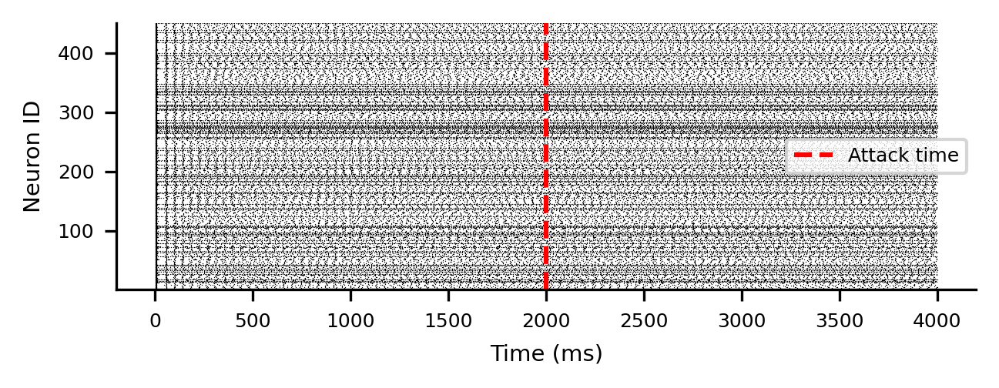

In [134]:
plot_raster_simple(AB, 4000, title='', apply_style=True)
plt.axvline(x=2000, color='r', linestyle='--', label='Attack time')
plt.legend()

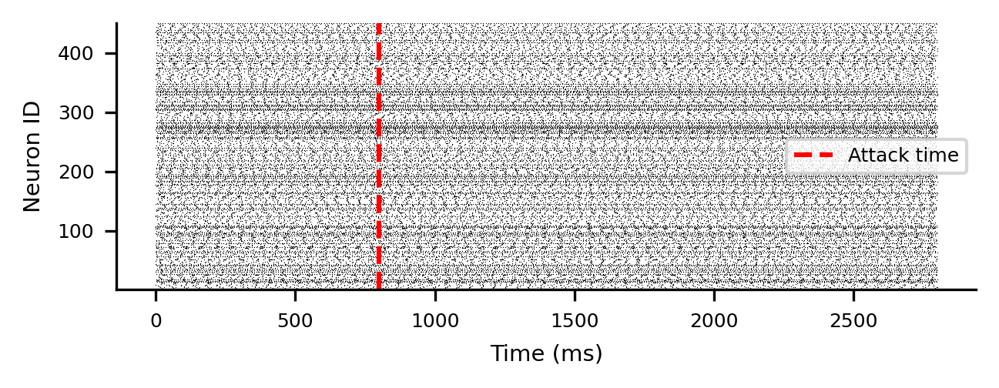

In [135]:
plot_raster_simple(AB[filter_relaxation:], total_T, title='', apply_style=True)
plt.axvline(x=where_attack*0.25, color='r', linestyle='--', label='Attack time')
plt.legend()

In [136]:

spkt_base = [convert_to_spiketrains(AB[filter_relaxation:].astype(np.int32), T=total_T)]

In [137]:
from elephant.gpfa import GPFA
import quantities as pq

#spkt_base = [convert_to_spiketrains(spike_train_base.astype(np.int32), T=2000)]
# specify fitting parameters
bin_size = 0.5 * pq.ms
latent_dimensionality = 3

gpfa_2dim = GPFA(bin_size=bin_size, x_dim=latent_dimensionality)

gpfa_2dim.fit(spkt_base)
print(gpfa_2dim.params_estimated.keys())

trajectories = gpfa_2dim.transform(spkt_base)


Initializing parameters using factor analysis...

Fitting GPFA model...
dict_keys(['covType', 'gamma', 'eps', 'd', 'C', 'R', 'notes'])


In [139]:
attack_spike = convert_to_spiketrains(final_attack_array_mask.reshape(-1,1),T=total_T)
attack_spike[0][0]

array(800.) * ms

In [140]:
final_attack_array_mask.shape
arr = final_attack_array_mask
# Reshape into (n_bins, bin_size)
binned = arr.reshape(-1, 2)
# Take max across each bin
half_binned = binned.max(axis=1)
print(half_binned.shape)  # (6800,)
where_attack_binned = np.where(half_binned==1)[0][0]
where_attack_binned

(5600,)


np.int64(1600)

In [141]:
trajectories

array([array([[ 0.04011875,  0.04187598,  0.04398802, ..., -0.04484824,
               -0.05093792, -0.05637145],
              [ 0.01160735,  0.008499  ,  0.00404305, ..., -0.00876882,
               -0.00825799, -0.0077841 ],
              [-0.03203383, -0.03027007, -0.02777491, ..., -0.01222155,
               -0.00906492, -0.00610558]], shape=(3, 5600))            ],
      dtype=object)

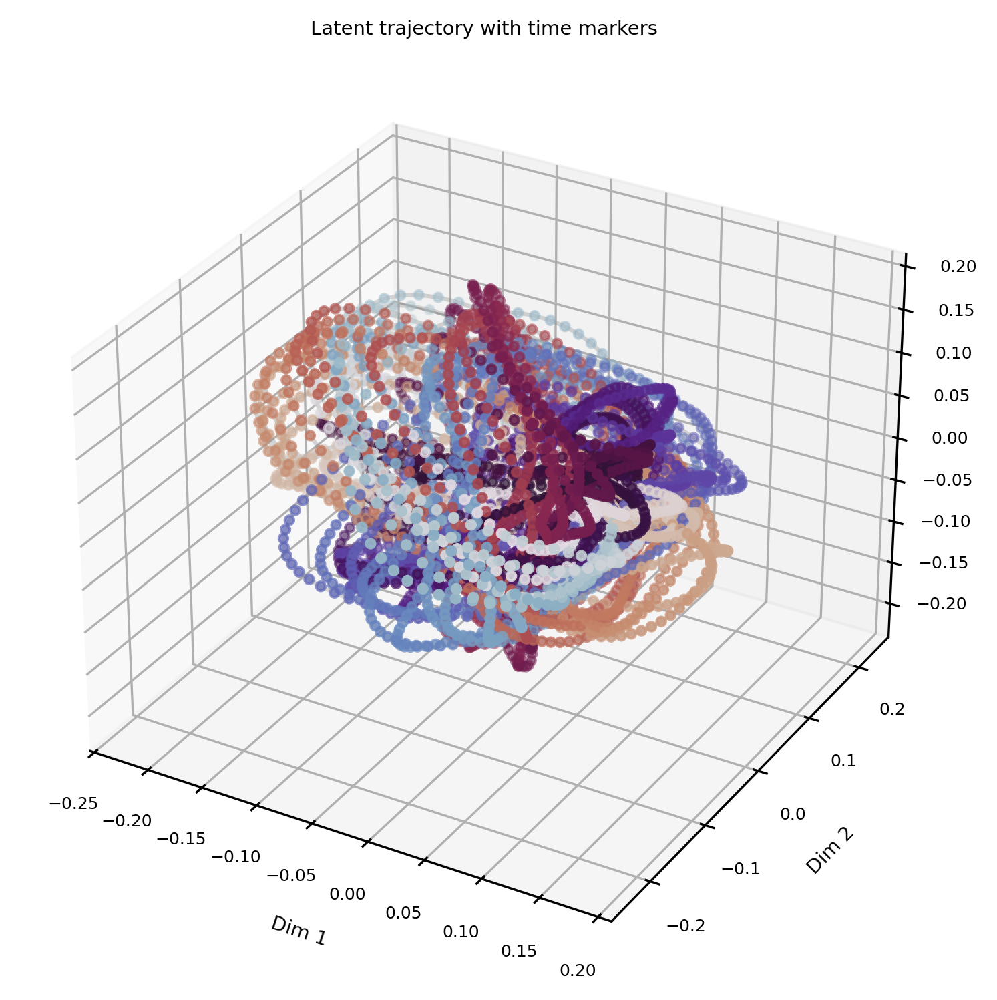

In [142]:
import matplotlib.pyplot as plt
import numpy as np

# Example trajectory (3 dims, T steps)
traj = np.mean(trajectories, axis=0)
x, y, z = traj

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')

# faint continuous line
ax.plot(x, y, z, '-', color='gray', alpha=0.3)

# overlay time markers every 20 steps
step = 1
ax.scatter(x[::step], y[::step], z[::step], c=np.arange(0, len(x), step),
           cmap='twilight', s=10)

ax.set_xlabel("Dim 1")
ax.set_ylabel("Dim 2")
ax.set_zlabel("Dim 3")
ax.set_title("Latent trajectory with time markers")
plt.tight_layout()
plt.show()

2025-10-02 10:20:50,455 |     INFO | animation.py:1076 | Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2025-10-02 10:20:50,455 |     INFO | animation.py:319 | MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 2100x1500 -pix_fmt rgba -framerate 30 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y rotating_trajectory.mp4


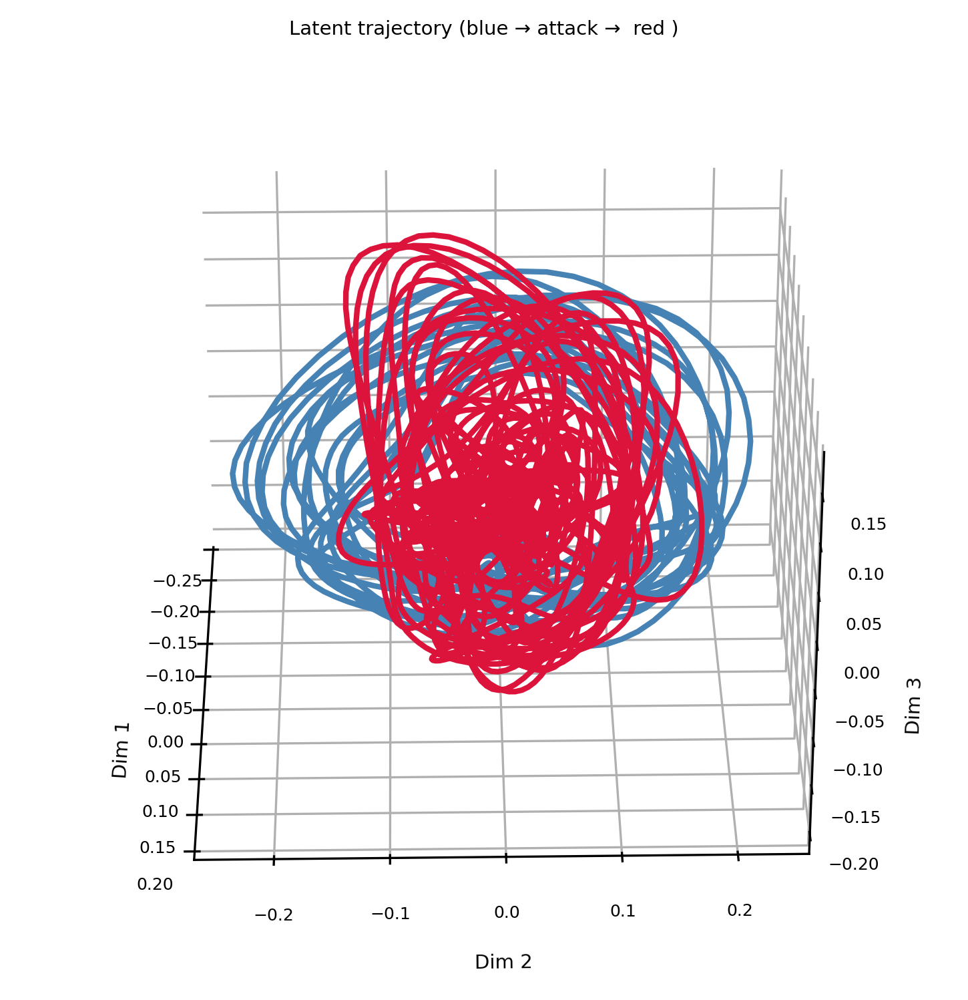

In [149]:
import numpy as np
import matplotlib.pyplot as plt

# Example trajectory
traj = np.mean(trajectories, axis=0)
x, y, z = traj
T = len(x)

attack_mask = half_binned
if len(attack_mask) < T:
    factor = T // len(attack_mask)
    attack_mask = np.repeat(attack_mask, factor)

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')

# Find first attack index
attack_indices = np.where(attack_mask == 1)[0]
if len(attack_indices) > 0:
    first_attack = attack_indices[0]
else:
    first_attack = T  # no attack at all
# Prettier colour choices
normal_colour = "#4682B4"   # steel blue
attack_colour = "#DC143C"   # crimson red

# Plot before attack
ax.plot(x[:first_attack+1],
        y[:first_attack+1],
        z[:first_attack+1],
        color=normal_colour, linewidth=2)

# Plot after attack
if first_attack < T:
    ax.plot(x[first_attack:],
            y[first_attack:],
            z[first_attack:],
            color=attack_colour, linewidth=2)


ax.set_xlabel("Dim 1")
ax.set_ylabel("Dim 2")
ax.set_zlabel("Dim 3")
ax.set_title("Latent trajectory (blue → attack →  red )")
plt.tight_layout()

# Clean view
ax.xaxis.pane.set_visible(False)
ax.yaxis.pane.set_visible(False)
ax.zaxis.pane.set_visible(False)
#ax.grid(False)
# ax.set_xticks([])
# ax.set_yticks([])
# ax.set_zticks([])
# ax.set_xlabel("")
# ax.set_ylabel("")
# ax.set_zlabel("")

#ax.set_axis_off()


import matplotlib.animation as animation

def rotate(angle):
    ax.view_init(elev=30, azim=angle)

ani = animation.FuncAnimation(fig, rotate, frames=360, interval=50)
ani.save("rotating_trajectory.mp4", writer="ffmpeg", fps=30)
plt.show()


2025-10-01 23:49:20,980 |     INFO | animation.py:1076 | Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2025-10-01 23:49:20,981 |     INFO | animation.py:319 | MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 2100x1500 -pix_fmt rgba -framerate 120 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y trajectory_with_static_blue_red_500.mp4


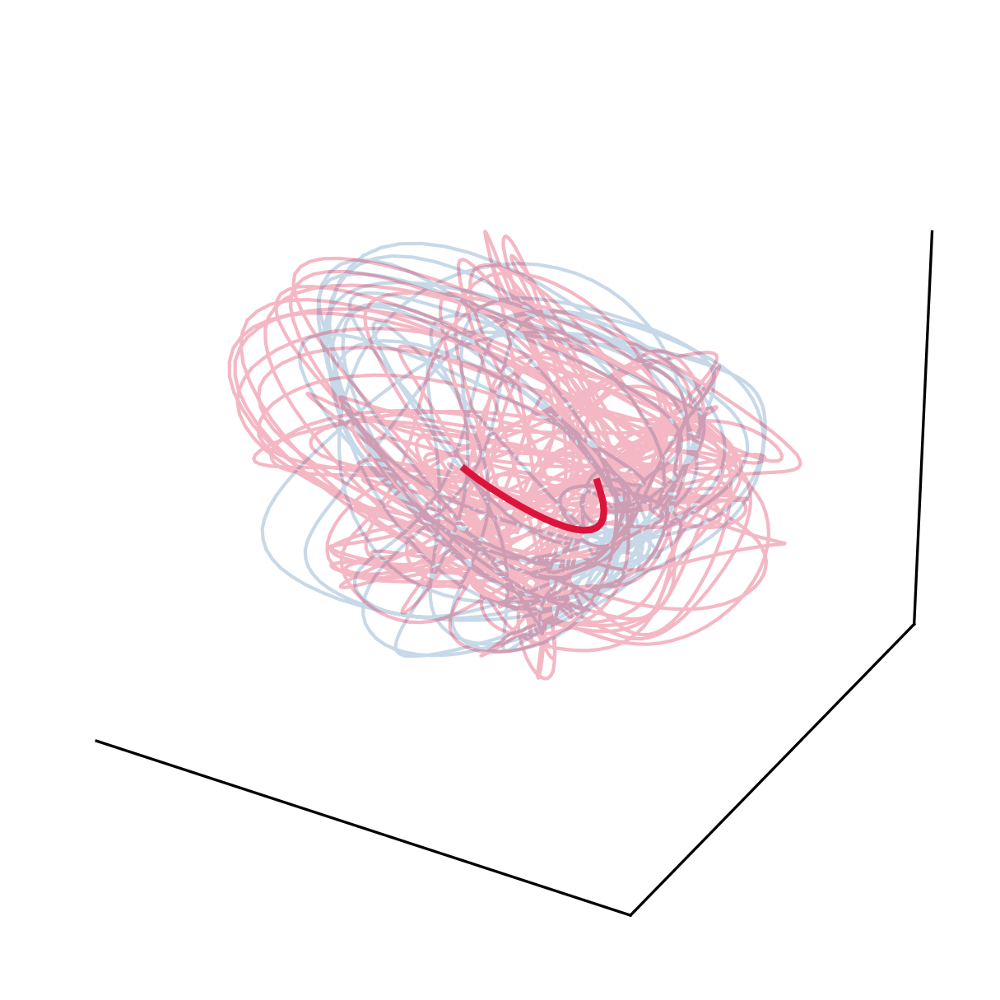

In [146]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Example trajectory
traj = np.mean(trajectories, axis=0)
x, y, z = traj
T = len(x)

attack_mask = half_binned
if len(attack_mask) < T:
    factor = T // len(attack_mask)
    attack_mask = np.repeat(attack_mask, factor)

# Find first attack index
attack_indices = np.where(attack_mask == 1)[0]
if len(attack_indices) > 0:
    first_attack = attack_indices[0]
else:
    first_attack = T  # no attack at all

# Colours
normal_colour = "#4682B4"   # steel blue
attack_colour = "#DC143C"   # crimson red

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection="3d")

# Clean view
ax.xaxis.pane.set_visible(False)
ax.yaxis.pane.set_visible(False)
ax.zaxis.pane.set_visible(False)
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_zlabel("")

# initialise static path segments, trail, and point
static_blue, = ax.plot([], [], [], lw=1, alpha=0.3, color=normal_colour)
static_red, = ax.plot([], [], [], lw=1, alpha=0.3, color=attack_colour)
trail, = ax.plot([], [], [], lw=2)
#point, = ax.plot([], [], [], "o", color="black")

# set bounds so axes don’t jump
ax.set_xlim(x.min(), x.max())
ax.set_ylim(y.min(), y.max())
ax.set_zlim(z.min(), z.max())

def init():
    for artist in (static_blue, static_red, trail):
        artist.set_data([], [])
        artist.set_3d_properties([])
    return static_blue, static_red, trail#, point

def update(frame):
    # indices for the trail
    start = max(0, frame-20)
    end = frame+1

    # --- static past ---
    if frame < first_attack:
        # only blue history
        static_blue.set_data(x[:end], y[:end])
        static_blue.set_3d_properties(z[:end])
        static_red.set_data([], [])
        static_red.set_3d_properties([])
    else:
        # blue segment frozen up to first_attack
        static_blue.set_data(x[:first_attack], y[:first_attack])
        static_blue.set_3d_properties(z[:first_attack])
        # red segment grows after first_attack
        static_red.set_data(x[first_attack:end], y[first_attack:end])
        static_red.set_3d_properties(z[first_attack:end])

    # --- bright trail + point ---
    colour = normal_colour if frame < first_attack else attack_colour
    trail.set_data(x[start:end], y[start:end])
    trail.set_3d_properties(z[start:end])
    trail.set_color(colour)

    # point.set_data([x[frame]], [y[frame]])
    # point.set_3d_properties([z[frame]])
    # point.set_color(colour)

    return static_blue, static_red, trail, #point

ani = FuncAnimation(fig, update, frames=T, init_func=init,
                    interval=50, blit=True)

ani.save("trajectory_with_static_blue_red_500.mp4", writer="ffmpeg", fps=120)
plt.show()



In [ ]:
import infomeasure as im
import antropy as ant
import numpy as np
import networkx as nx

im_args = {"approach": "miller_madow", "base": 2}
batch = 0
fraction = 0.33
N = step_data['metadata']['parameters']['N']

S_hist = step_data['arrays']['base_S_hist']
S_hist_R = step_data['arrays']['pruned_S_hist_batch'][batch]

test_fraction = int(len(S_hist) * fraction)

surviving_nodes = keep_indices(step_data['arrays']['removed_ids'][batch], N)
A = S_hist[-test_fraction:, surviving_nodes]
B = S_hist_R[:test_fraction]
C = S_hist_R[-test_fraction:]

# Entropy of network microstates (rows = time, columns = neurons)
h_A = im.entropy(A, **im_args)
h_B = im.entropy(B, **im_args)
h_C = im.entropy(C, **im_args)

In [83]:

post_batch_entropies = []
post_batch_times = []
window_size = test_fraction
step_size = 100

for batch in range(64):
    entropies = []
    times = []

    surviving_nodes = keep_indices(step_data['arrays']['removed_ids'][batch], N)
    A = step_data['arrays']['base_S_hist']
    A = A[:, surviving_nodes]
    im_args = {"approach": "miller_madow", "base": 2}

    B = step_data['arrays']['pruned_S_hist_batch'][batch]
    A = np.concatenate([A,B], axis=0)

        # Time axis for this batch
    T_total = 4000   # or whatever your experiment duration is
    T = A.shape[0]
    dt = T_total / T
    real_time_axis = np.arange(T) * dt

    for start in tqdm(range(0, A.shape[0] - window_size + 1, step_size)):
        window = A[start:start+window_size]
        H = im.entropy(window, **im_args)
        entropies.append(H)
        # Offset post times so they start after pre
        #times.append(times[-1] + (start + window_size//2) if times else (start + window_size//2))
        center_idx = start + window_size // 2

        times.append(real_time_axis[center_idx])

    post_batch_entropies.append(entropies)
    post_batch_times.append(times)



100%|██████████| 134/134 [00:04<00:00, 27.55it/s]


In [84]:

import numpy as np

# Stack all batches to shape (num_batches, num_timepoints)
# First, pad shorter arrays with np.nan so all are the same length
max_len = max(len(x) for x in post_batch_entropies)
entropy_mat = np.full((len(post_batch_entropies), max_len), np.nan)
for i, arr in enumerate(post_batch_entropies):
    entropy_mat[i, :len(arr)] = arr

# Compute mean and 95% bootstrap CIs at each timepoint
n_boot = 1000
means = np.nanmean(entropy_mat, axis=0)
cis_low = []
cis_high = []

rng = np.random.default_rng(seed=42)
for t in range(entropy_mat.shape[1]):
    vals = entropy_mat[:, t]
    vals = vals[~np.isnan(vals)]
    if len(vals) == 0:
        cis_low.append(np.nan)
        cis_high.append(np.nan)
        continue
    boots = rng.choice(vals, size=(n_boot, len(vals)), replace=True)
    boots_mean = np.mean(boots, axis=1)
    cis_low.append(np.percentile(boots_mean, 2.5))
    cis_high.append(np.percentile(boots_mean, 97.5))


# ...existing code...

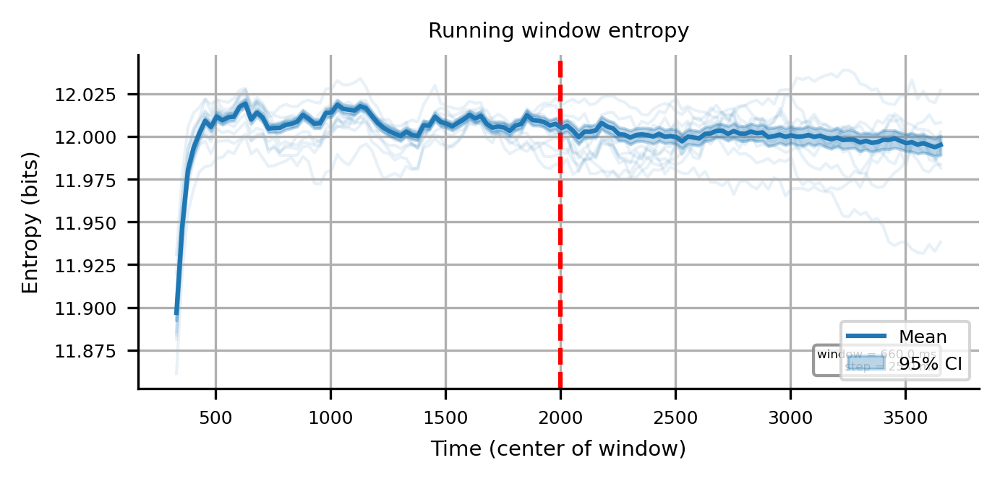

In [85]:
# Use the time axis from the first batch (assumes all aligned)
time_axis = post_batch_times[0][:max_len]
# Build the annotation string
params_text = f"window = {window_size*0.25:.1f} ms\nstep = {step_size*0.25:.1f} ms"

plt.figure(figsize=(5,2))

for batch in range(10):
    plt.plot(post_batch_times[batch], post_batch_entropies[batch], color='C0', alpha=0.1, zorder=0, linewidth=1)

plt.plot(time_axis, means, color='C0', label='Mean', zorder=9)
plt.fill_between(time_axis, cis_low, cis_high, color='C0', alpha=0.3, label='95% CI', zorder=8)

plt.xlabel("Time (center of window)")
plt.ylabel("Entropy (bits)")
plt.axvline(2000, color='red', linestyle='--')

# Put parameters in a text box inside the plot
plt.text(
    0.95, 0.05, params_text,
    transform=plt.gca().transAxes,   # relative to axes (0–1)
    ha='right', va='bottom',
    fontsize=4,
    bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray', boxstyle='round,pad=0.3')
)

plt.title("Running window entropy")
plt.grid(True)
plt.legend()
plt.show()


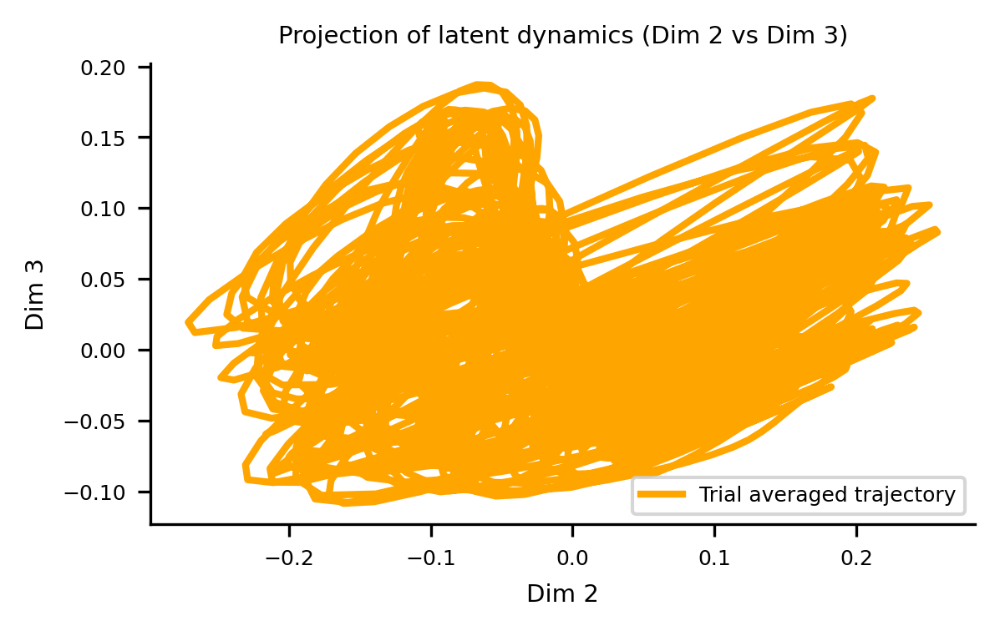

In [41]:
import numpy as np
import matplotlib.pyplot as plt

# Example parameters (adjust as needed)
linewidth_single_trial = 1
color_single_trial = "gray"
alpha_single_trial = 0.6
linewidth_trial_average = 2
color_trial_average = "Orange"

fig, ax = plt.subplots(1, 1, figsize=(4, 4))

ax.set_title('Projection of latent dynamics (Dim 2 vs Dim 3)')
ax.set_xlabel('Dim 2')
ax.set_ylabel('Dim 3')
ax.set_aspect(1)

# single trial trajectories
for single_trial_trajectory in trajectories:
    ax.plot(
        single_trial_trajectory[1],  # Dim 2
        single_trial_trajectory[2],  # Dim 3
        '-', lw=linewidth_single_trial,
        c=color_single_trial,
        alpha=alpha_single_trial
    )

# trial averaged trajectory
average_trajectory = np.mean(trajectories, axis=0)
ax.plot(
    average_trajectory[1],  # Dim 2
    average_trajectory[2],  # Dim 3
    '-', lw=linewidth_trial_average,
    c=color_trial_average,
    label='Trial averaged trajectory', alpha=1
)

ax.legend()
plt.tight_layout()
plt.show()

NameError: name 'linewidth_single_trial' is not defined

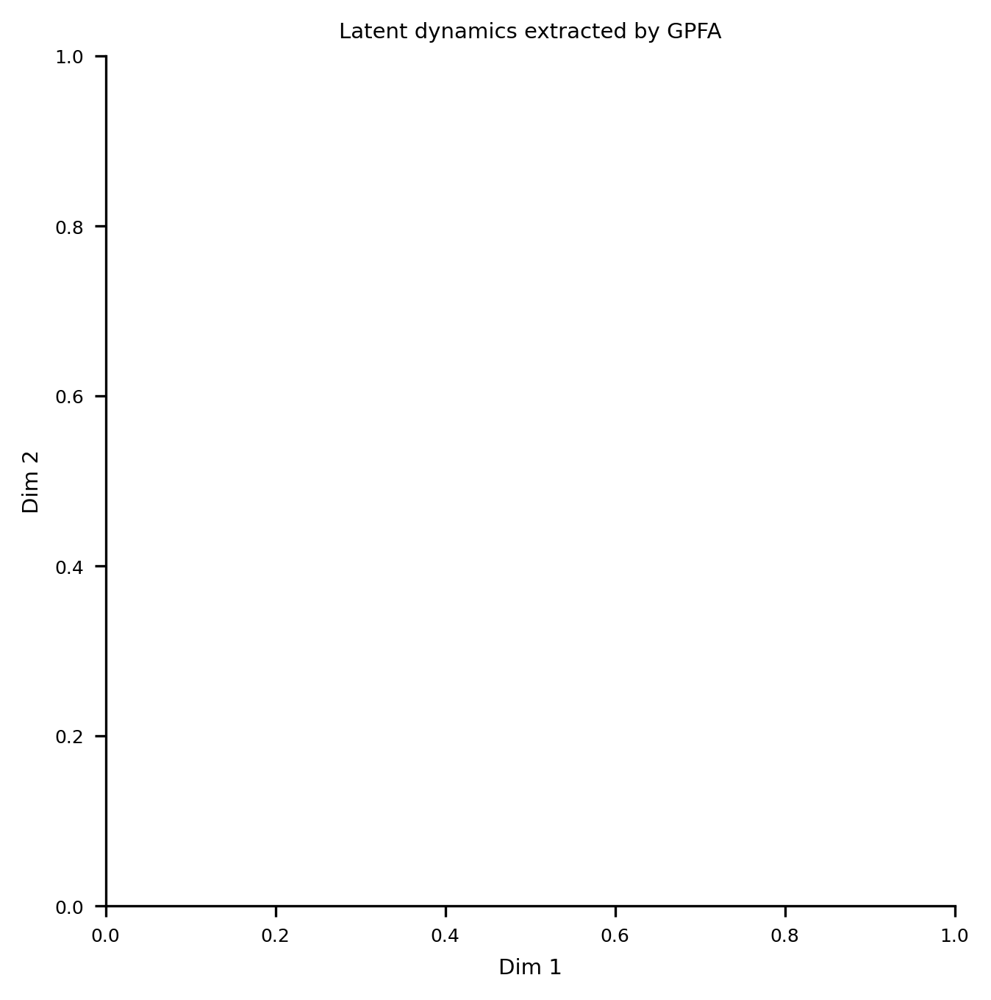

In [33]:
fig, ax2 = plt.subplots(1, 1, figsize=(7, 5))
ax2.set_title('Latent dynamics extracted by GPFA')
ax2.set_xlabel('Dim 1')
ax2.set_ylabel('Dim 2')
ax2.set_aspect(1)
# single trial trajectories
for single_trial_trajectory in trajectories:
    ax2.plot(single_trial_trajectory[0], single_trial_trajectory[1], '-', lw=linewidth_single_trial, c=color_single_trial, alpha=alpha_single_trial)
# trial averaged trajectory
average_trajectory = np.mean(trajectories, axis=0)
ax2.plot(average_trajectory[0], average_trajectory[1], '-', lw=linewidth_trial_average, c=color_trial_average, label='Trial averaged trajectory')
ax2.legend()

plt.tight_layout()
plt.show()

In [5]:
from networks import run_single_network, create_random_network
from utils import plot_raster, plot_adjacency_matrix


In [78]:
neurons, G = create_random_network(N=30, p_connect=0.9, weight_bounds=(0.1,0.2))

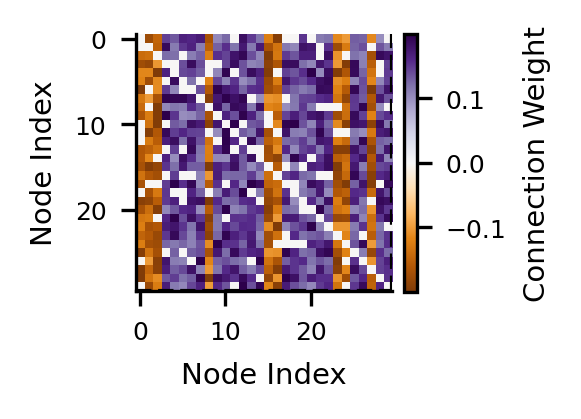

In [79]:
plot_adjacency_matrix(G, figsize=(2,2))
plt.show()

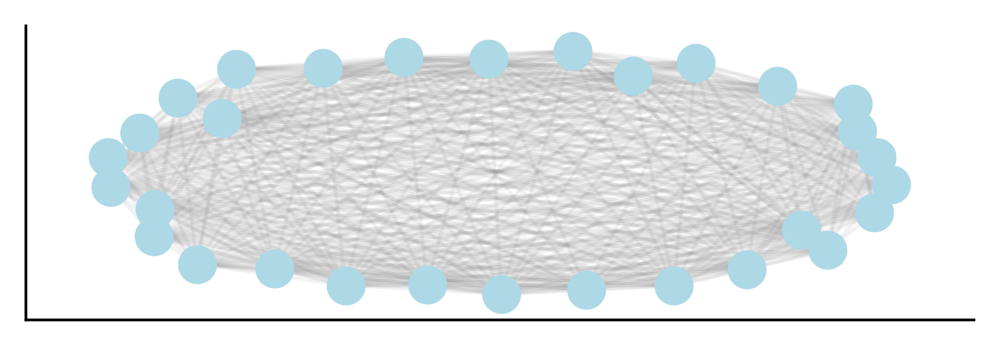

In [80]:
import networkx as nx
import matplotlib.pyplot as plt

# Plot with arrowsH = G.to_undirected()
H = G.to_undirected()


# Layout
pos = nx.spring_layout(H, k=3)

# Draw nodes & labels
nx.draw_networkx_nodes(H, pos, node_size=100, node_color="lightblue")
#nx.draw_networkx_labels(H, pos)

# Draw edges with transparency
nx.draw_networkx_edges(H, pos, edge_color="grey", alpha=0.1, width=1)

plt.show()

In [81]:
T_seconds = 2
T =int( T_seconds* 1000)
trials = []
for trial in range(10):
    V_hist, S_hist, I_syn_hist, I_ext, final_state, final_stdp_state = run_single_network(
    neurons, G, network_type='stdp_syn', T=T, nkey=32 +trial)
    trials.append(S_hist)



In [82]:
V_hist

Array([[-61.53337 , -64.706535, -63.496952, ..., -62.150394, -62.379974,
        -63.67898 ],
       [-59.536934, -62.646965, -61.497665, ..., -60.34029 , -60.740158,
        -61.953625],
       [-57.463783, -60.63817 , -59.500343, ..., -58.486763, -59.06993 ,
        -60.23963 ],
       ...,
       [-61.110577, -64.25823 , -60.356354, ..., -58.286316, -70.596756,
        -65.778534],
       [-60.654766, -64.01666 , -59.83238 , ..., -57.536808, -70.5326  ,
        -65.603165],
       [-60.16675 , -63.762165, -59.254704, ..., -56.714542, -70.466   ,
        -65.51843 ]], dtype=float32)

In [83]:
S_hist.astype(np.int32)

Array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

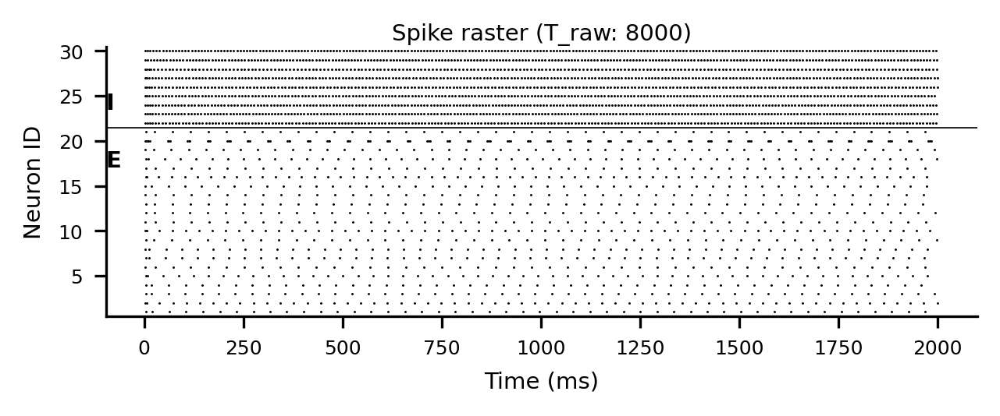

In [84]:
plot_raster(S_hist, neurons, final_state.W, T_total=T, title=f'Spike raster (T_raw: {int(T/0.25)})')
plt.show()

In [74]:
16000//3

5333

In [75]:
# s0 = S_hist.shape[0]
# S_fraction = S_hist[-s0//3:,:]
# S_fraction.shape
fraction_trials = []
for t in trials:
    s0 = t.shape[0]
    S_fraction = t[-s0//3:,:]
    fraction_trials.append(S_fraction)


In [76]:
from elephant.gpfa import GPFA

spkt_base = [convert_to_spiketrains(spike_train_base.astype(np.int32), T=T) for spike_train_base in fraction_trials]
# specify fitting parameters
bin_size = 2 * pq.ms
latent_dimensionality = 3

gpfa_2dim = GPFA(bin_size=bin_size, x_dim=latent_dimensionality)

gpfa_2dim.fit(spkt_base)
print(gpfa_2dim.params_estimated.keys())

trajectories = gpfa_2dim.transform(spkt_base)

NameError: name 'pq' is not defined

NameError: name 'trajectories' is not defined

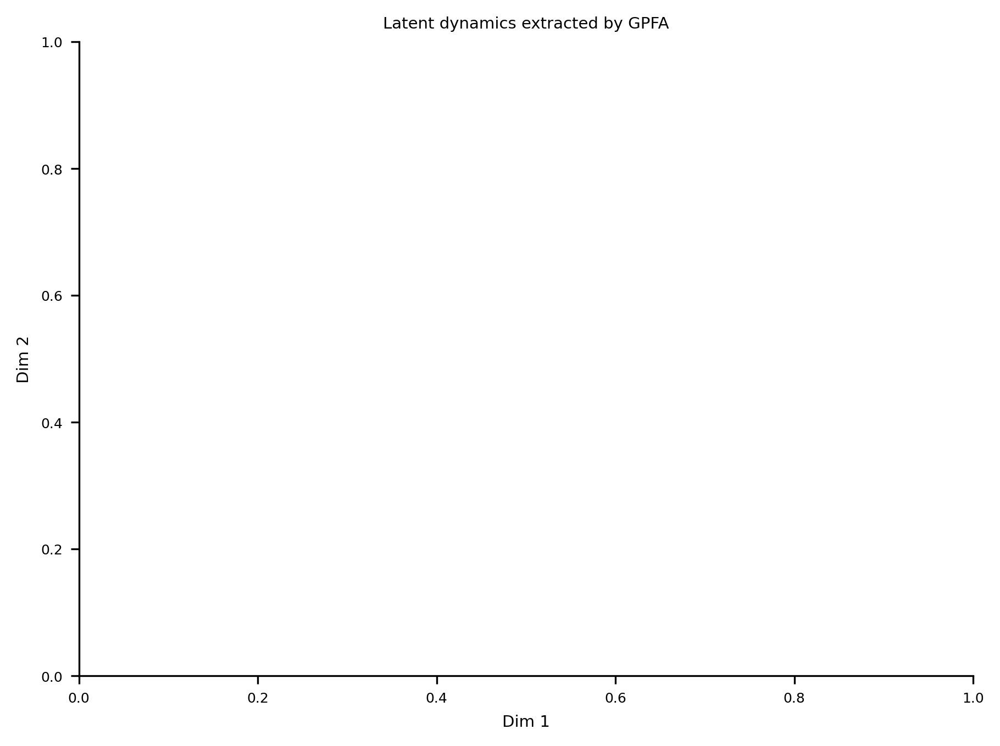

In [77]:
fig, ax2 = plt.subplots(1, 1, figsize=(7, 5))
ax2.set_title('Latent dynamics extracted by GPFA')
ax2.set_xlabel('Dim 1')
ax2.set_ylabel('Dim 2')
#ax2.set_aspect(1)
# single trial trajectories
for single_trial_trajectory in trajectories:
    ax2.plot(single_trial_trajectory[0], single_trial_trajectory[1], '-', lw=linewidth_single_trial, c=color_single_trial, alpha=alpha_single_trial)
# trial averaged trajectory
average_trajectory = np.mean(trajectories, axis=0)
ax2.plot(average_trajectory[0], average_trajectory[1], '-', lw=linewidth_trial_average, c=color_trial_average, label='Trial averaged trajectory')
ax2.legend()

plt.tight_layout()
plt.show()

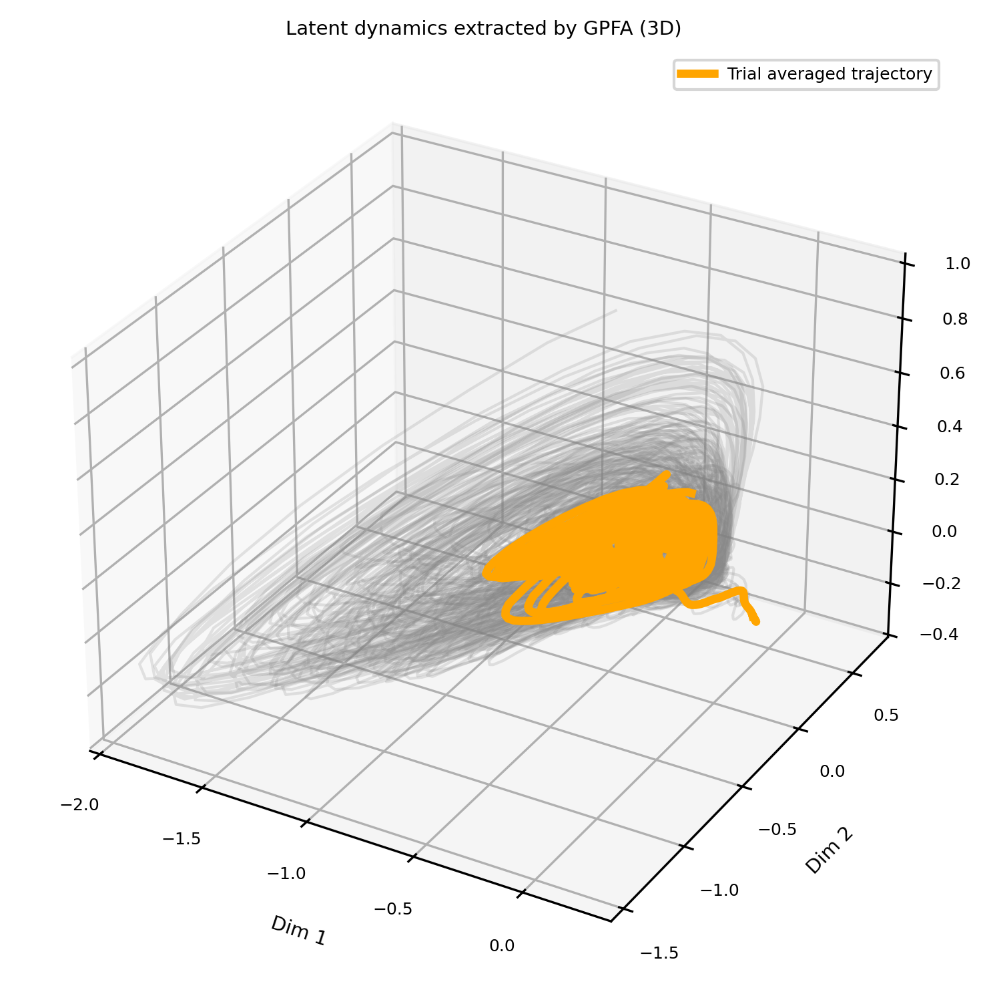

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # registers 3D projection

# Example parameters (adjust as in your original code)
linewidth_single_trial = 1
color_single_trial = "gray"
alpha_single_trial = 0.2
linewidth_trial_average = 3
color_trial_average = "orange"

# Create 3D figure
fig = plt.figure(figsize=(7, 5))
ax3 = fig.add_subplot(111, projection='3d')

ax3.set_title('Latent dynamics extracted by GPFA (3D)')
ax3.set_xlabel('Dim 1')
ax3.set_ylabel('Dim 2')
ax3.set_zlabel('Dim 3')

# single trial trajectories
for single_trial_trajectory in trajectories:
    ax3.plot(
        single_trial_trajectory[0],
        single_trial_trajectory[1],
        single_trial_trajectory[2],
        '-', lw=linewidth_single_trial,
        c=color_single_trial,
        alpha=alpha_single_trial
    )

# trial averaged trajectory
average_trajectory = np.mean(trajectories, axis=0)
ax3.plot(
    average_trajectory[0],
    average_trajectory[1],
    average_trajectory[2],
    '-', lw=linewidth_trial_average,
    c=color_trial_average,
    label='Trial averaged trajectory'
)

ax3.legend()
plt.tight_layout()
plt.show()

In [154]:
average_trajectory

array([[-4.65386024e-01, -4.65883125e-01, -4.65787592e-01, ...,
         2.31550107e-01,  2.31523873e-01,  2.31497420e-01],
       [ 5.87785775e-02,  6.41414455e-02,  6.96262289e-02, ...,
        -3.09723700e-05, -3.81746114e-05, -4.62733831e-05],
       [-4.47837042e-02, -4.21599063e-02, -3.87631924e-02, ...,
         3.59162109e-04,  3.62559977e-04,  3.66498709e-04]],
      shape=(3, 8000))

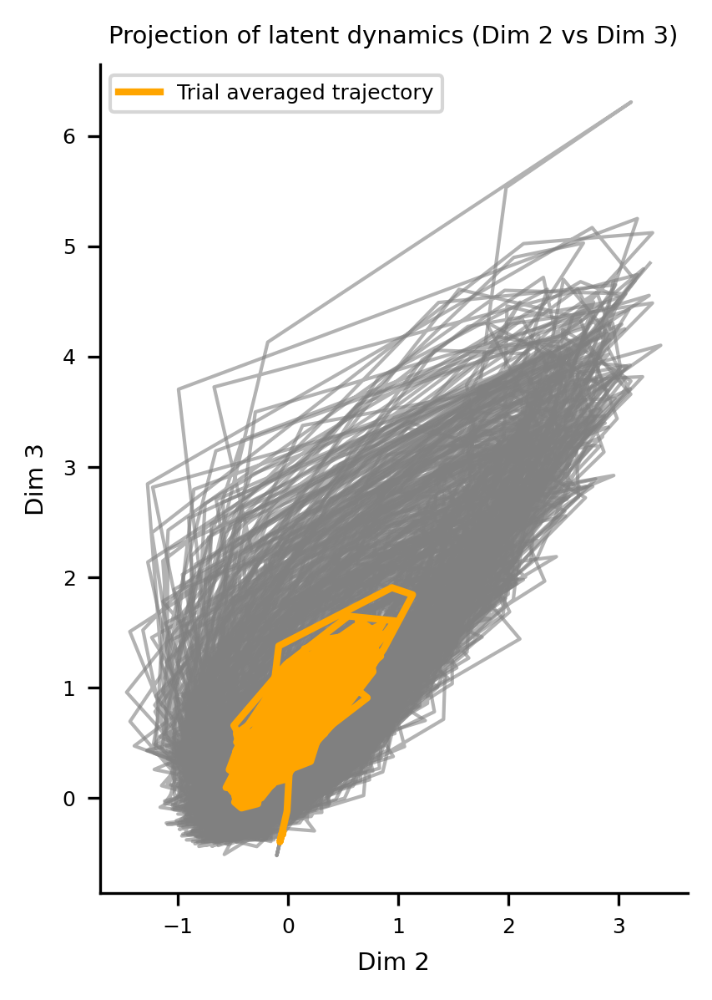

In [75]:
import numpy as np
import matplotlib.pyplot as plt

# Example parameters (adjust as needed)
linewidth_single_trial = 1
color_single_trial = "gray"
alpha_single_trial = 0.6
linewidth_trial_average = 2
color_trial_average = "Orange"

fig, ax = plt.subplots(1, 1, figsize=(4, 4))

ax.set_title('Projection of latent dynamics (Dim 2 vs Dim 3)')
ax.set_xlabel('Dim 2')
ax.set_ylabel('Dim 3')
ax.set_aspect(1)

# single trial trajectories
for single_trial_trajectory in trajectories:
    ax.plot(
        single_trial_trajectory[1],  # Dim 2
        single_trial_trajectory[2],  # Dim 3
        '-', lw=linewidth_single_trial,
        c=color_single_trial,
        alpha=alpha_single_trial
    )

# trial averaged trajectory
average_trajectory = np.mean(trajectories, axis=0)
ax.plot(
    average_trajectory[1],  # Dim 2
    average_trajectory[2],  # Dim 3
    '-', lw=linewidth_trial_average,
    c=color_trial_average,
    label='Trial averaged trajectory', alpha=1
)

ax.legend()
plt.tight_layout()
plt.show()

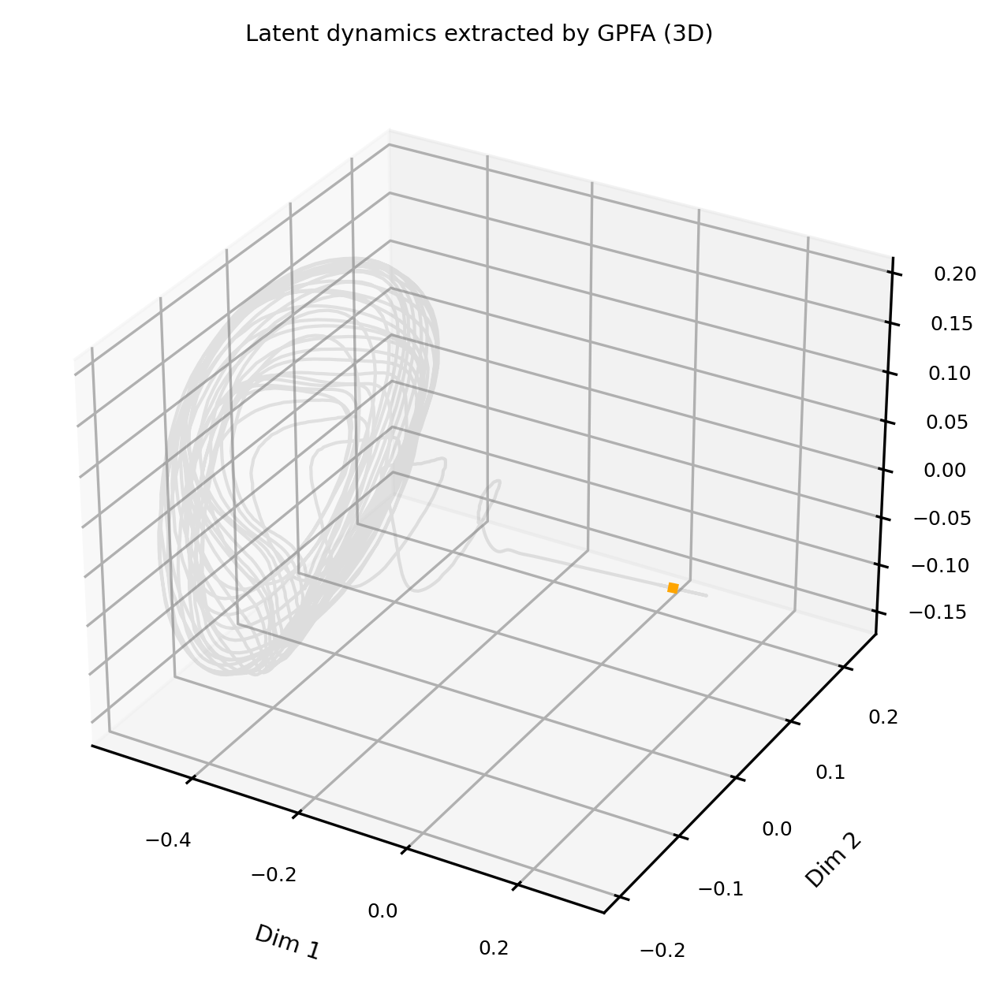

In [152]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # registers 3D projection
from matplotlib.animation import FuncAnimation, FFMpegWriter

# Parameters
linewidth_single_trial = 1
color_single_trial = "gray"
alpha_single_trial = 0.2
linewidth_trial_average = 2
color_trial_average = "orange"
tail_length = 10   # how many points behind the head to highlight

# Example: use your average trajectory as the main one
trajectory = np.mean(trajectories, axis=0)  # shape (3, T)
x, y, z = trajectory[0], trajectory[1], trajectory[2]

# Create figure
fig = plt.figure(figsize=(7, 5))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('Latent dynamics extracted by GPFA (3D)')
ax3.set_xlabel('Dim 1')
ax3.set_ylabel('Dim 2')
ax3.set_zlabel('Dim 3')

# Plot the full trajectory in background (faint gray)
ax3.plot(x, y, z, '-', lw=linewidth_single_trial, c=color_single_trial, alpha=alpha_single_trial)

# Dynamic elements: a moving "head" + short tail
(head_line,) = ax3.plot([], [], [], '-', lw=3, c=color_trial_average, alpha=1)

def init():
    head_line.set_data([], [])
    head_line.set_3d_properties([])
    return (head_line,)

def update(frame):
    start = max(0, frame - tail_length)
    head_line.set_data(x[start:frame+1], y[start:frame+1])
    head_line.set_3d_properties(z[start:frame+1])
    return (head_line,)

ani = FuncAnimation(fig, update, frames=len(x), init_func=init,
                    blit=True, interval=50)

# Save the animation (requires ffmpeg installed)
writer = FFMpegWriter(fps=60, metadata=dict(artist='Me'), bitrate=1800)
ani.save("latent_dynamics.mp4", writer=writer)

plt.show()

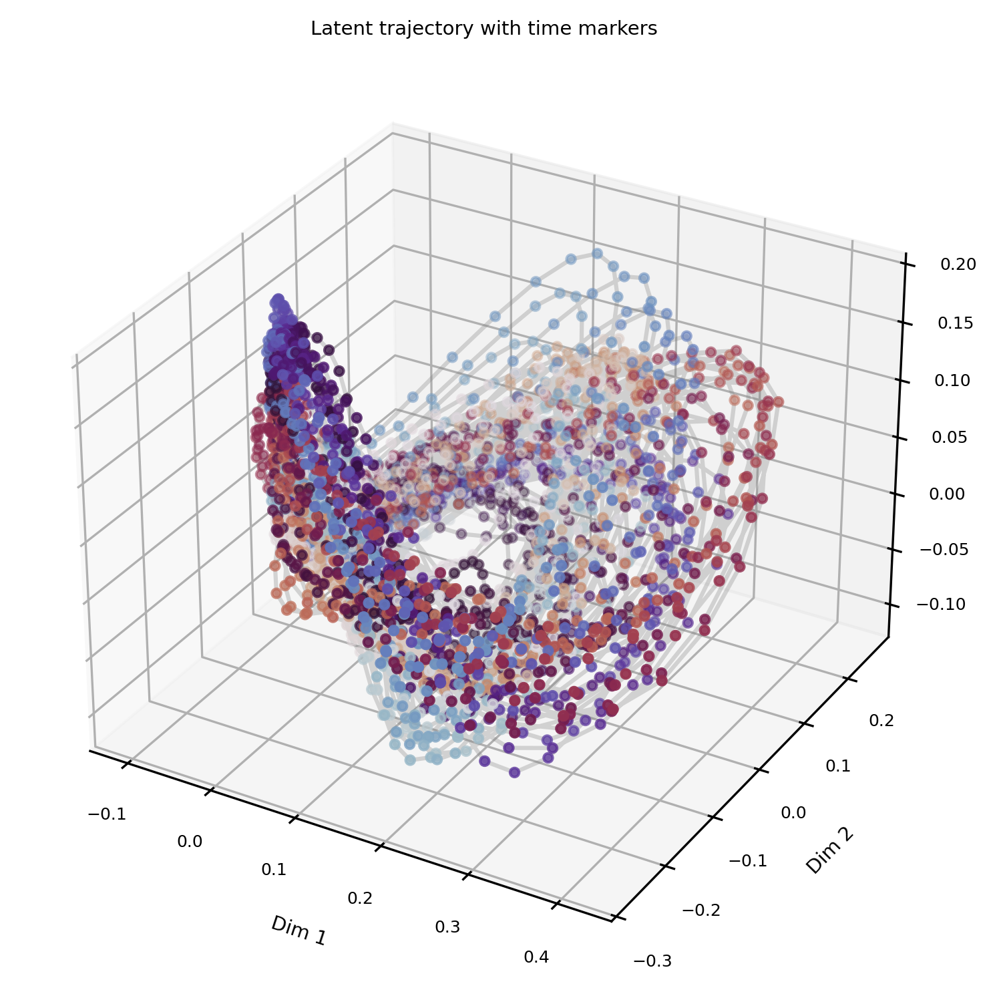

In [56]:
import matplotlib.pyplot as plt
import numpy as np

# Example trajectory (3 dims, T steps)
traj = np.mean(trajectories, axis=0)
x, y, z = traj

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')

# faint continuous line
ax.plot(x, y, z, '-', color='gray', alpha=0.3)

# overlay time markers every 20 steps
step = 1
ax.scatter(x[::step], y[::step], z[::step], c=np.arange(0, len(x), step),
           cmap='twilight', s=10)

ax.set_xlabel("Dim 1")
ax.set_ylabel("Dim 2")
ax.set_zlabel("Dim 3")
ax.set_title("Latent trajectory with time markers")
plt.tight_layout()
plt.show()

In [93]:
from elephant.spike_train_synchrony import spike_contrast

spike_contrast(spkt_base[0], t_start=0* pq.ms, t_stop=T* pq.ms, min_bin=0.25*pq.ms)

np.float64(0.357486739835852)

In [85]:
import numpy as np
import quantities as pq
from elephant.spike_train_generation import homogeneous_poisson_process
from elephant.spike_train_synchrony import spike_contrast
import viziphant
%matplotlib inline
np.random.seed(24)

spkt_base = [convert_to_spiketrains(spike_train_base.astype(np.int32), T=T) for spike_train_base in trials]

spiketrains = spkt_base[0]
synchrony, trace = spike_contrast(spiketrains, return_trace=True, min_bin=0.25*pq.ms)
#viziphant.spike_train_synchrony.plot_spike_contrast(trace,
#     spiketrains=spiketrains, c='gray', s=1)
#plt.show()

In [90]:
synchrony

np.float64(0.357486739835852)

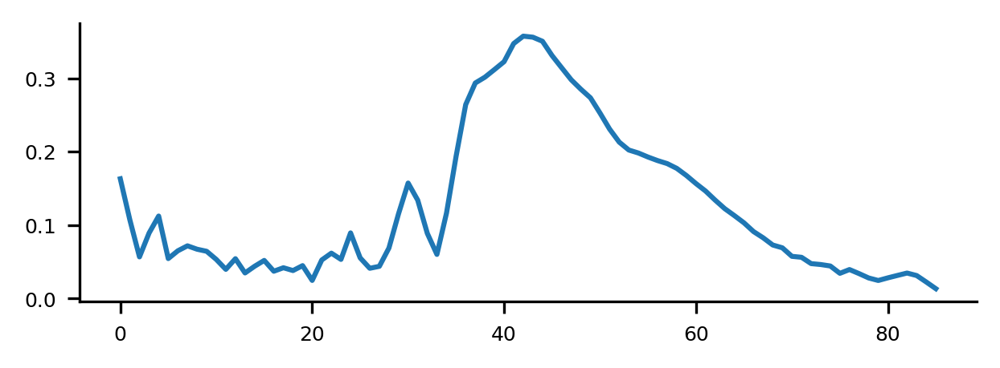

In [87]:
plt.plot(trace.synchrony)

In [49]:
kuramoto_from_binary(S_hist.astype(np.int32))

(array([       nan,        nan,        nan, ..., 0.99876673, 0.99974088,
        1.        ], shape=(16000,)),
 np.float64(0.302735577179294),
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]], shape=(16000, 100)))

In [69]:
S = S_hist.astype(np.int32)


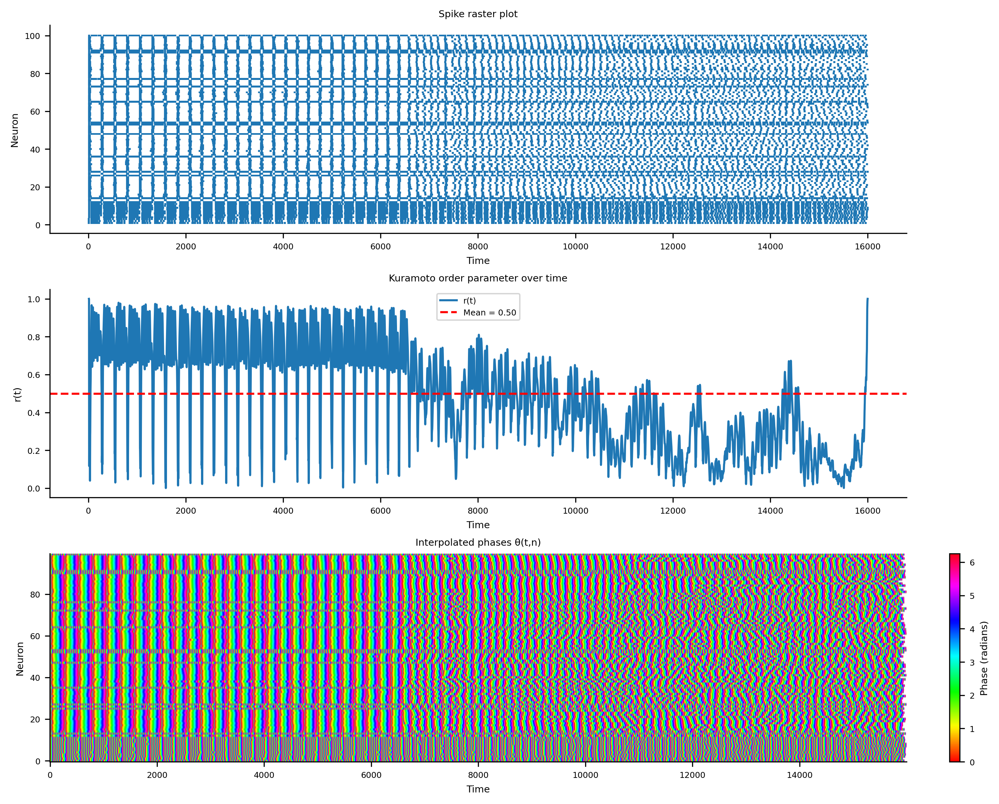

In [70]:
import numpy as np
import matplotlib.pyplot as plt
import numpy as np

def kuramoto_from_binary(S):
    """
    Compute a time-resolved Kuramoto synchrony index from a binary spike matrix.

    Parameters
    ----------
    S : array-like, shape (T, N)
        Binary spike matrix: T time bins by N neurones. S[t, n] is 1 if neurone n
        spikes in bin t, otherwise 0.

    Returns
    -------
    r_t : ndarray, shape (T,)
        Kuramoto order parameter over time; NaN where insufficient phase data.
    r_mean : float
        Time-average of r_t, ignoring NaNs (overall synchrony score).
    theta : ndarray, shape (T, N)
        Interpolated phases for each neurone over time in [0, 2π); NaN where
        phase is undefined (e.g., before first spike or after last spike).
    """

    # Unpack dimensions: T time bins, N neurones.
    T, N = S.shape

    # For each neurone, find the indices (time bins) where spikes occur.
    # spike_idx[n] is an array like [t0, t1, ...] for neurone n.
    spike_idx = [np.flatnonzero(S[:, n]) for n in range(N)]

    # Allocate the phase matrix theta (T x N) and fill with NaN to indicate
    # "phase not defined" (e.g., outside inter-spike intervals).
    theta = np.full((T, N), np.nan, float)

    # Build phases neurone by neurone.
    for n in range(N):
        idx = spike_idx[n]

        # We need at least two spikes to define a phase that increases
        # between spikes; otherwise skip this neurone.
        if len(idx) < 2:
            continue

        # For each consecutive spike pair (t0 -> t1), linearly interpolate
        # phase from 0 to 2π across the bins [t0, t1).
        for k in range(len(idx) - 1):
            t0, t1 = idx[k], idx[k+1]
            span = t1 - t0  # number of bins in this inter-spike interval

            # Guard against pathological cases (shouldn't happen with strictly
            # increasing spike indices, but we’re cautious).
            if span <= 0:
                continue

            # np.arange(span) produces 0, 1, ..., span-1.
            # Divide by span to get ramp in [0, 1), then scale by 2π.
            theta[t0:t1, n] = 2*np.pi * (np.arange(span) / span)

        # Define the phase exactly at the last spike time as 0 (equivalently 2π).
        # After the last spike, phase remains NaN (undefined) by design.
        theta[idx[-1], n] = 0.0

    # Allocate the time-resolved Kuramoto order parameter r(t).
    # It will be NaN at times where no neurone has a defined phase.
    r_t = np.full(T, np.nan)

    # For each time bin, compute the circular mean length over neurones
    # that have a valid phase at that time.
    for t in range(T):
        valid = ~np.isnan(theta[t])  # neurones with defined phase at time t
        if valid.any():
            # Convert phases to unit phasors e^{iθ}, average across neurones,
            # and take the magnitude |·| to get r(t) ∈ [0, 1].
            r_t[t] = np.abs(np.mean(np.exp(1j * theta[t, valid])))

    # Global (time-averaged) synchrony, ignoring times where r(t) is NaN.
    r_mean = np.nanmean(r_t)

    # Return the time series r(t), its mean, and the full phase matrix.
    return r_t, r_mean, theta



# Compute Kuramoto
r_t, r_mean, theta = kuramoto_from_binary(S)



first_spikes = [np.argmax(S[:, n]) if S[:, n].any() else T for n in range(N)]
order = np.argsort(first_spikes)
S = S[:, order]
theta = theta[:, order]


# --- Plots ---
fig, axs = plt.subplots(3, 1, figsize=(10, 8), constrained_layout=True)

# Raster plot of spikes
for n in range(N):
    axs[0].vlines(np.flatnonzero(S[:, n]), n + 0.5, n + 1.5)
axs[0].set_title("Spike raster plot")
axs[0].set_ylabel("Neuron")
axs[0].set_xlabel("Time")

# Kuramoto order parameter over time
axs[1].plot(r_t, label="r(t)")
axs[1].axhline(r_mean, color="red", linestyle="--", label=f"Mean = {r_mean:.2f}")
axs[1].set_title("Kuramoto order parameter over time")
axs[1].set_ylabel("r(t)")
axs[1].set_xlabel("Time")
axs[1].legend()

# Heatmap of phases
im = axs[2].imshow(theta.T, aspect="auto", origin="lower", cmap="hsv")
axs[2].set_title("Interpolated phases θ(t,n)")
axs[2].set_ylabel("Neuron")
axs[2].set_xlabel("Time")
fig.colorbar(im, ax=axs[2], label="Phase (radians)")

plt.show()


In [57]:
S_hist.astype(np.int32)

Array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [82]:
2**6

64

In [83]:
2**6

64